# <font color='#000000'>__Exercício Prático 2__</font>
## <font color='#4894db'>__Deteção de Pose__</font>
#### <font color='#4b4b4b'>Master Big Data Aplicado ao Futebol <br> Módulo 6 - Machine Learning - Introdução às técnicas e modelos aplicáveis <br> Desenvolvido por: Hugo Alves </font>

__Enunciado do Exercício__

<i> Este notebook é um exemplo de código criado para a deteção de pose humana.
Os alunos que quiserem pegar neste notbook e alargar as suas capacidades são bem vindos, no entanto o exercicio pretende que os alunos usem o notebook como ferramenta para os seus videos e apresentem uma deteção de pose que lhes seja util e apropriada para melhorar as codições de trabalho no mundo do futebol.
</i>
<br> <br>

Neste notebook, o código e comentários (até à parte de "Aplicação ao Exemplo") serão adaptados do notebook de exemplo fornecido. De seguida, __destacamos como a deteção de pose pode ser relevante no momento da execução de grandes penalidades__, e propomos igualmente um exemplo do que pode ser o output gerado nesta circunstância.

Começamos por instalar o mediapipe, uma biblioteca de python que nos permite usar diversos modelos de imagem de forma simplificada.

In [1]:
!pip install mediapipe==0.10.21 opencv-python==4.11.0.86

Fazemos o import das nossas bibliotecas e defenimos o mp_drawing e mp_pose que são objectos do mediapipe que premitem a deteção de pose e o desenho das deteções.

Escrevemos também o nome do vídeo a que queremos aplicar a deteção de pose. No caso, iremos utilizar um exemplo de um vídeo uma das grandes penalidades da final do Mundial de 2022, entre a França e a Argentina.

O resultado final do processo de deteção será um novo video com as anotações. Assim sendo precisamos de dizer tambem qual o nome que queremos dar ao novo vídeo.

In [2]:
import cv2
import mediapipe as mp
import numpy as np
from IPython.display import display, HTML
from base64 import b64encode
from google.colab import files

mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose
video_file_path = 'Penalty_Example.mp4'  # Substituir pelo nome do vosso video a testar
output_video_path = 'Penalty_Example_Pose_Estimation.mp4'  # Substituir pelo nome do novo video a ser gerado com as anotações

Criamos uma função para mostrar o vídeo no notebook e usamos a mesma para tal.

In [3]:
def show_video(file_path, width = 640):
    video = open(file_path, 'rb').read()
    video_encoded = b64encode(video).decode('utf-8')
    display(HTML(f'<video alt="video" controls autoplay loop width="{width}"><source src="data:video/mp4;base64,{video_encoded}" type="video/mp4" /></video>'))

cap = cv2.VideoCapture(video_file_path)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Break the loop if there are no more frames to read

    # Display frame (optional if you want to see individual frames in Colab)
    # cv2.imshow('Video Feed', frame)  # Comment out or remove this line

    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

# Display the video in Colab
show_video(video_file_path)

Este é o código que vai usar o video que escolheram para detectar a pose de todos os humanos na imagem. Basta correrem esta celula e descarregar o video gerado com as anotações gravado com o nome definido em output_video_path.

In [4]:
cap = cv2.VideoCapture(video_file_path)

# Get video properties
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Setup mediapipe instance
with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break  # Break the loop if there are no more frames to read

        # Recolor image to RGB
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image.flags.writeable = False

        # Make detection
        results = pose.process(image)

        # Recolor back to BGR
        image.flags.writeable = True
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

        try:
            landmarks = results.pose_landmarks.landmark
        except:
            pass

        # Render detections
        mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                                mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=2),
                                mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                                 )

        # Write the frame with pose detections to the output video
        out.write(image)

        if cv2.waitKey(10) & 0xFF == ord('q'):
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()

Agora que têm o video com as deteções e anotações escolham um angulo entre os pontos da imagem que querem analisar. No caso de exemplo deste notebook vamos analisar o angulo do joelho no acto do remate ou seja o angulo entre a anca ->joelho->pé

Como podem ver na celula abaixo, têm acesso a todos estes pontos do corpo detectados pelo modelo. Escolham a parte do corpo que querem analisar e vejam quais destes pontos precisam para calcular esse angulo.

In [5]:
for lndmrk in mp_pose.PoseLandmark:
    print(lndmrk.value, lndmrk.name)

0 NOSE
1 LEFT_EYE_INNER
2 LEFT_EYE
3 LEFT_EYE_OUTER
4 RIGHT_EYE_INNER
5 RIGHT_EYE
6 RIGHT_EYE_OUTER
7 LEFT_EAR
8 RIGHT_EAR
9 MOUTH_LEFT
10 MOUTH_RIGHT
11 LEFT_SHOULDER
12 RIGHT_SHOULDER
13 LEFT_ELBOW
14 RIGHT_ELBOW
15 LEFT_WRIST
16 RIGHT_WRIST
17 LEFT_PINKY
18 RIGHT_PINKY
19 LEFT_INDEX
20 RIGHT_INDEX
21 LEFT_THUMB
22 RIGHT_THUMB
23 LEFT_HIP
24 RIGHT_HIP
25 LEFT_KNEE
26 RIGHT_KNEE
27 LEFT_ANKLE
28 RIGHT_ANKLE
29 LEFT_HEEL
30 RIGHT_HEEL
31 LEFT_FOOT_INDEX
32 RIGHT_FOOT_INDEX


Para a análise do ângulo do joelho preciso das coordenadas da anca direita...

In [6]:
landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value]

x: 0.0815641955
y: 0.684905946
z: 0.0389073752
visibility: 0.999431133

... mas também das coordenadas do joelho direito...

In [7]:
landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value]

x: 0.0963169709
y: 0.742894232
z: 0.0759001896
visibility: 0.674079478

... e ainda das coordenadas do pé direito.


In [8]:
landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value]

x: 0.116128817
y: 0.82320261
z: 0.107787564
visibility: 0.804454386

Guardamos estas coordenadas em variáveis.

In [9]:
anca = [landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].y]
joelho = [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y]
pe = [landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].y]

anca, joelho, pe

([0.08156419545412064, 0.6849059462547302],
 [0.09631697088479996, 0.7428942322731018],
 [0.1161288172006607, 0.8232026100158691])

Agora que temos as coordenadas dos membros que nos importam, podemos usar a função da celula abaixo para calcular o ângulo entre estes membros. Como queremos calcular o ângulo do joelho, este tem de ser o argumento central da função, ou seja, o valor b.

In [10]:
def calculate_angle(a,b,c):
    a = np.array(a) # First
    b = np.array(b) # Mid
    c = np.array(c) # End

    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)

    if angle >180.0:
        angle = 360-angle

    return angle

calculate_angle(anca, joelho, pe)

179.5842126808331

O processo de calculo do angulo foi aplicado apenas a uma imagem. Para aplicar a todo o código e gerar um video com as anotações e valor do ângulo em tempo real podemos usar o código da proxima célula.

In [11]:
cap = cv2.VideoCapture(video_file_path)

# Get video properties
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

# Setup mediapipe instance
with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break  # Break the loop if there are no more frames to read

        # Recolor image to RGB
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image.flags.writeable = False

        # Make detection
        results = pose.process(image)

        # Recolor back to BGR
        image.flags.writeable = True
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

        # Extract landmarks
        try:
            landmarks = results.pose_landmarks.landmark

            # Get coordinates
            anca = [landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value].y]
            joelho = [landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value].y]
            pe = [landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].x,landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].y]

            # Calculate angle
            angle = calculate_angle(anca, joelho, pe)

            # Visualize angle
            cv2.putText(image, str(angle),
                           tuple(np.multiply(joelho, [640, 480]).astype(int)),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2, cv2.LINE_AA
                                )

        except:
            pass


        # Render detections
        mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                                mp_drawing.DrawingSpec(color=(245,117,66), thickness=2, circle_radius=2),
                                mp_drawing.DrawingSpec(color=(245,66,230), thickness=2, circle_radius=2)
                                 )

        # Write the frame with pose detections to the output video
        out.write(image)

        if cv2.waitKey(10) & 0xFF == ord('q'):
            break

    cap.release()
    out.release()
    cv2.destroyAllWindows()

O novo video foi gravado e pode ser descarregado para verem no vosso pc.

# <font color="#4894db">_____________________</font>
# <font color='#4b4b4b'>Aplicação ao Exemplo</font> <a class="anchor" id="setup"></a>

Dentro de um jogo de futebol, o posicionamento do corpo de um jogador é dos indicadores mais fortes das ações que este executa ou pretende executar, mas é também dos mais difíceis de analisar, mesmo com recurso a ferramentas avançadas de análise de vídeo. E __se em jogo corrido a pose já é relevante, ganha ainda outro peso no momento das grandes penalidades__, em que os guarda-redes tentam decifrar, em frações de segundo, para onde o batedor pretende enviar a bola com base na sua posição corporal.
Nesse sentido, a existência de um algoritmo de deteção de pose e análise biomecânica apresenta-se como um fator potencialmente decisivo para analistas e treinadores de guarda-redes poderem observar e antecipar o comportamento dos adversários em jogo. No vídeo de exemplo, de um penálti batido pela França no desempate por grande penalidades frente à Argentina, do Mundial de 2022, o uso de um algoritmo deste tipo poderia ter permitido à equipa técnica e guarda-redes franceses analisar com maior precisão os penáltis da Argentina batidos até então (que não foram poucos), adaptar o treino deste tipo de lance, e eventualmente alterar o desfecho da final.

Assim, nesta segunda parte do notebook, propomos uma estrutura simplificada (e com código construído com uma grande contribuição do Claude) para gerar um output útil para estes elementos técnicos e jogadores, que possa ser diretamente aplicável na análise de vídeo de grandes penalidades.

In [12]:
# Importação das bibliotecas adicionais necessárias para esta parte
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.signal import savgol_filter, find_peaks
import os

Começamos por contar os frames do vídeo no quais conseguimos captar a posição do pé direito do batedor, guardando estas coordenadas para uma lista para depois tentar calcular a sua velocidade.

In [13]:
cap = cv2.VideoCapture(video_file_path)
foot_positions = []
frame_indices = []
frame_idx = 0

with mp_pose.Pose(min_detection_confidence = 0.5, min_tracking_confidence = 0.5) as pose:
  while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
      break

    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image.flags.writeable = False
    results = pose.process(image)

    try:
      landmarks = results.pose_landmarks.landmark
      foot_x = landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].x
      foot_y = landmarks[mp_pose.PoseLandmark.RIGHT_FOOT_INDEX.value].y
      foot_positions.append((foot_x, foot_y))
      frame_indices.append(frame_idx)
    except:
      foot_positions.append(None)
      frame_indices.append(frame_idx)

    frame_idx += 1

cap.release()
print(f"Processados {frame_idx} frames")

Processados 152 frames


A partir das coordenadas do pé do jogador, o objetivo aqui é tentar encontrar o momento de contacto com a bola (de modo a evitar ter de aplicar um outro modelo ou técnica para encontrar a bola). Para isso, calculamos a velocidade do movimento do pé (tentando ajustá-la ao noise do vídeo) e tentamos encontrar um pico de velocidade, que deverá corresponder ao momento imediatamente antes do remate.

Contacto com a bola identificado do frame: 66 (tempo de vídeo: 2.20s)


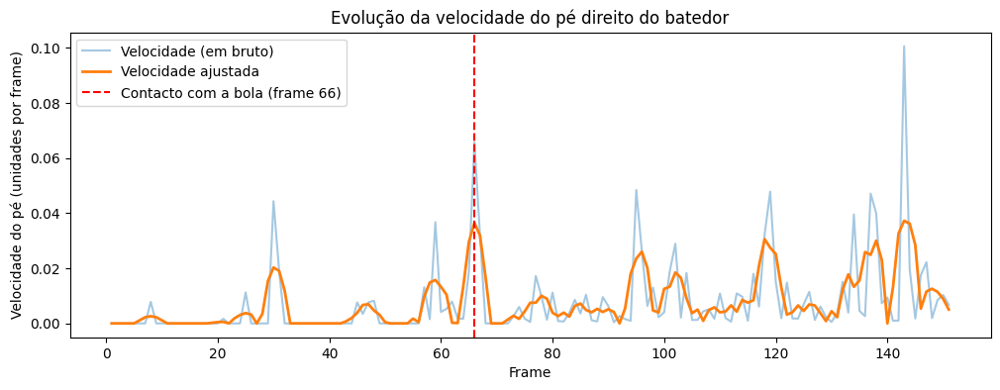

In [14]:
# Velocidade frame a frame
velocities = []
valid_frames = []

for i in range(1, len(foot_positions)):
  if foot_positions[i] is not None and foot_positions[i-1] is not None:
    dx = foot_positions[i][0] - foot_positions[i-1][0]
    dy = foot_positions[i][1] - foot_positions[i-1][1]
    velocity = np.sqrt(dx**2 + dy**2)
    velocities.append(velocity)
    valid_frames.append(frame_indices[i])
  else:
    velocities.append(0)
    valid_frames.append(frame_indices[i])

# Tentar eliminar o noise através de um filtro Savitzky-Golay
velocities_array = np.array(velocities)
smoothed_velocities = savgol_filter(velocities_array, window_length = 7, polyorder = 2)
smoothed_velocities = np.clip(smoothed_velocities, 0, None)  # Velocidades negativas (caso existam) ajustadas para 0

# Encontrar picos nas velocidades ajustadas
peaks, properties = find_peaks(smoothed_velocities, prominence = 0.01, distance = 5)

if len(peaks) > 0:
  # Encontrar o maior pico que não esteja nos últimos 10% do vídeo (à partida o penálti já terá sido batido antes)
  cutoff = int(len(valid_frames) * 0.9)
  valid_peaks = [p for p in peaks if valid_frames[p] < cutoff]

  if valid_peaks:
    best_peak = valid_peaks[np.argmax(smoothed_velocities[valid_peaks])]
    contact_frame = valid_frames[best_peak]
  else:
    # Se não der, seguimos com o maior pico global
    best_peak = peaks[np.argmax(smoothed_velocities[peaks])]
    contact_frame = valid_frames[best_peak]
else:
  contact_frame = valid_frames[np.argmax(smoothed_velocities)]

print(f"Contacto com a bola identificado do frame: {contact_frame} (tempo de vídeo: {contact_frame/fps:.2f}s)")

# Fazer plot das velocidades e do momento de contacto com a bola
plt.figure(figsize = (12, 4))
plt.plot(valid_frames, velocities, alpha = 0.4, label = "Velocidade (em bruto)")
plt.plot(valid_frames, smoothed_velocities, label = "Velocidade ajustada", linewidth = 2)
plt.axvline(x = contact_frame, color = "r", linestyle = "--", label = f"Contacto com a bola (frame {contact_frame})")
plt.xlabel("Frame")
plt.ylabel("Velocidade do pé (unidades por frame)")
plt.title("Evolução da velocidade do pé direito do batedor")
plt.legend()
plt.show()

__Nota do futuro:__ Ao analisar o output, observamos que o contacto não foi feito no frame 66 mas sim, muito provavelmente, num outro pico pouco depois desse momento. Tendo em conta o gráfico acima, aplicámos o código abaixo (comentado para não estar a gerar e guardar ficheiros) para identificar visualmente com base nos frames 95 a 99 e fazer um hard-code do frame de contacto com a bola. Não é o ideal, mas é o possível neste notebook de exemplo, em que o foco incide mais sobre a abordagem do que propriamente no código e no output conseguido.

In [15]:
"""
# Guardar frames no intervalo especificado
cap = cv2.VideoCapture(video_file_path)
frames_to_check = range(95, 100)

for f in frames_to_check:
  cap.set(cv2.CAP_PROP_POS_FRAMES, f)
  ret, frame = cap.read()
  if ret:
      cv2.imwrite(f'frame_{f}.jpg', frame)

cap.release()

# Mostrar frames
from IPython.display import Image, display
for f in frames_to_check:
    print(f"Frame {f}:")
    display(Image(f"frame_{f}.jpg", width = 400))
"""

'\n# Guardar frames no intervalo especificado\ncap = cv2.VideoCapture(video_file_path)\nframes_to_check = range(95, 100)\n\nfor f in frames_to_check:\n  cap.set(cv2.CAP_PROP_POS_FRAMES, f)\n  ret, frame = cap.read()\n  if ret:\n      cv2.imwrite(f\'frame_{f}.jpg\', frame)\n\ncap.release()\n\n# Mostrar frames\nfrom IPython.display import Image, display\nfor f in frames_to_check:\n    print(f"Frame {f}:")\n    display(Image(f"frame_{f}.jpg", width = 400))\n'

Na realidade, reconhecemos o momento do remate como tendo sido no frame 97.

In [16]:
contact_frame = 97

Guardámos o frame de contacto com a bola para utilizar mais à frente. Na célula seguinte, vamos percorrer todos os frames do vídeo para obter as coordenadas dos pontos relevantes do corpo do batedor, à semelhança do que já tinha sido feito na primeira parte do notebook.

In [17]:
# Identificar landmarks (partes do corpo) relevantes  (outras poderiam ser acrescentadas)
LANDMARKS = {
  "right_hip": mp_pose.PoseLandmark.RIGHT_HIP,
  "left_hip": mp_pose.PoseLandmark.LEFT_HIP,
  "right_knee": mp_pose.PoseLandmark.RIGHT_KNEE,
  "left_knee": mp_pose.PoseLandmark.LEFT_KNEE,
  "right_ankle": mp_pose.PoseLandmark.RIGHT_ANKLE,
  "left_ankle": mp_pose.PoseLandmark.LEFT_ANKLE,
  "right_foot": mp_pose.PoseLandmark.RIGHT_FOOT_INDEX,
  "left_foot": mp_pose.PoseLandmark.LEFT_FOOT_INDEX,
  "right_shoulder": mp_pose.PoseLandmark.RIGHT_SHOULDER,
  "left_shoulder": mp_pose.PoseLandmark.LEFT_SHOULDER
}

cap = cv2.VideoCapture(video_file_path)
all_landmarks = {name: [] for name in LANDMARKS}
all_landmarks["frame"] = []
frame_idx = 0

with mp_pose.Pose(min_detection_confidence = 0.5, min_tracking_confidence = 0.5) as pose:
  while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
      break

    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image.flags.writeable = False
    results = pose.process(image)

    all_landmarks["frame"].append(frame_idx)

    try:
      lm = results.pose_landmarks.landmark
      for name, landmark_enum in LANDMARKS.items():
        x = lm[landmark_enum.value].x
        y = lm[landmark_enum.value].y
        all_landmarks[name].append((x, y))
    except:
      for name in LANDMARKS:
        all_landmarks[name].append(None)

    frame_idx += 1

cap.release()
print(f"Processados {frame_idx} frames")

Processados 152 frames


Já tendo percorrido o vídeo para identificar a posição do corpo do jogador, podemos agora calcular algumas métricas mais úteis para os intervenientes do jogo. Neste exemplo, vamos calcular apenas o ângulo do joelho da perna que executa o remate, a inclinação do tronco, e o ângulo da cintura, começando por criar funções auxiliares que nos permitiram obter estes mesmo indicadores.

In [18]:
def calculate_angle(a, b, c):
  """Calcula o ângulo entre os segmentos ab e bc"""
  a, b, c = np.array(a), np.array(b), np.array(c)
  radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
  angle = np.abs(radians * 180.0 / np.pi)
  if angle > 180.0:
    angle = 360 - angle
  return angle

def vertical_tilt(top, bottom):
  """Calcula a inclinação vertical com base em dois pontos"""
  dx = top[0] - bottom[0]
  dy = top[1] - bottom[1]
  angle = np.degrees(np.arctan2(dx, -dy))  # relative to vertical axis
  return angle

def horizontal_angle(left, right):
  """Calcula o alinhamento horizontal com base em dois pontos"""
  dx = right[0] - left[0]
  dy = right[1] - left[1]
  angle = np.degrees(np.arctan2(dy, dx))
  return angle

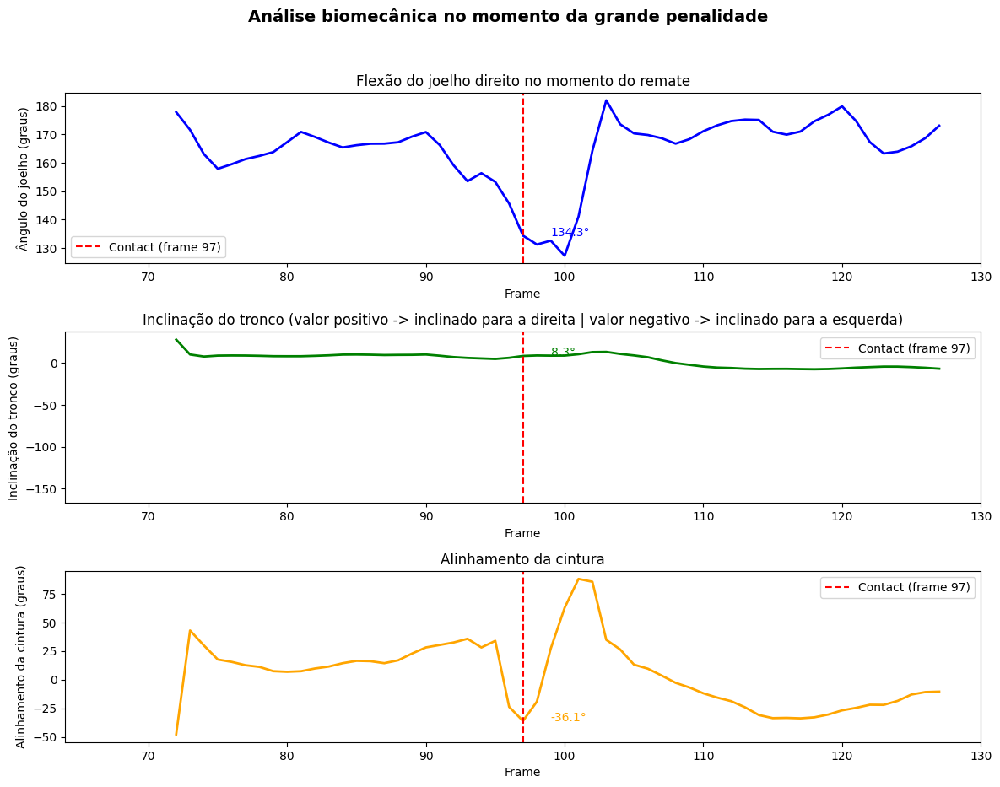

Métricas no momento do contacto com a bola (frame 97)
Ângulo do joelho: 134.3°
Inclinação do tronco: 8.3°
Alinhamento da cintura: -36.1°


In [19]:
# Definir janela de análise (vamos aqui focar-nos nos 30 frames - aproximadamente 1 segundo - antes e depois do momento de contacto com a bola)
WINDOW = 30
frame_start = max(0, contact_frame - WINDOW)
frame_end = min(frame_idx - 1, contact_frame + WINDOW)
frames = list(range(frame_start, frame_end + 1))

# Calcular métricas para todos os frames
knee_angles = []
body_tilts = []
hip_alignments = []

for f in frames:
  rh = all_landmarks["right_hip"][f]
  lh = all_landmarks["left_hip"][f]
  rk = all_landmarks["right_knee"][f]
  ra = all_landmarks["right_ankle"][f]
  rs = all_landmarks["right_shoulder"][f]
  ls = all_landmarks["left_shoulder"][f]

  if all(v is not None for v in [rh, lh, rk, ra, rs, ls]):
    # Ângulo do joelho (amplitude dada pela posição da cintura, joelho, e tornozelo)
    knee_angles.append(calculate_angle(rh, rk, ra))

    # Inclinação do tronco (ponto médio dos ombros relativo ao ponto médio da cintura)
    shoulder_mid = ((rs[0]+ls[0])/2, (rs[1]+ls[1])/2)
    hip_mid = ((rh[0]+lh[0])/2, (rh[1]+lh[1])/2)
    body_tilts.append(vertical_tilt(shoulder_mid, hip_mid))

    # Alinhamento horizontal da cintura
    hip_alignments.append(horizontal_angle(lh, rh))
  else:
    knee_angles.append(np.nan)
    body_tilts.append(np.nan)
    hip_alignments.append(np.nan)

# Aplicar novamente o filtro Savitzky-Golay para suavizar as métricas com base nos frames próximos
def smooth(data, window = 5):
  arr = np.array(data, dtype = float)
  valid = ~np.isnan(arr)
  if valid.sum() > window:
    arr[valid] = savgol_filter(arr[valid], window_length = window, polyorder = 2)
  return arr

knee_angles_s = smooth(knee_angles)
body_tilts_s = smooth(body_tilts)
hip_alignments_s = smooth(hip_alignments)

# Criar gráfico para cada métrica e a evolução ao longo dos frames
fig = plt.figure(figsize = (14, 10))
gs = gridspec.GridSpec(3, 1, hspace = 0.4)

metrics = [
  (knee_angles_s, "Ângulo do joelho (graus)", "Flexão do joelho direito no momento do remate", "blue"),
  (body_tilts_s, "Inclinação do tronco (graus)", "Inclinação do tronco (valor positivo -> inclinado para a direita | valor negativo -> inclinado para a esquerda)", "green"),
  (hip_alignments_s, "Alinhamento da cintura (graus)", "Alinhamento da cintura", "orange")
]

for i, (data, ylabel, title, color) in enumerate(metrics):
  ax = fig.add_subplot(gs[i])
  ax.plot(frames, data, color = color, linewidth = 2)
  ax.axvline(x = contact_frame, color = "red", linestyle = "--", label = f"Contact (frame {contact_frame})")
  ax.set_xlabel("Frame")
  ax.set_ylabel(ylabel)
  ax.set_title(title)
  ax.legend()
  # Mostrar valores no momento do remate
  contact_idx = frames.index(contact_frame)
  if not np.isnan(data[contact_idx]):
    ax.annotate(f"{data[contact_idx]:.1f}°",
                xy = (contact_frame, data[contact_idx]),
                xytext = (contact_frame + 2, data[contact_idx]),
                fontsize = 10, color = color)

plt.suptitle("Análise biomecânica no momento da grande penalidade", fontsize = 14, fontweight = "bold")
plt.show()

contact_idx = frames.index(contact_frame)
print(f"Métricas no momento do contacto com a bola (frame {contact_frame})")
print(f"Ângulo do joelho: {knee_angles_s[contact_idx]:.1f}°")
print(f"Inclinação do tronco: {body_tilts_s[contact_idx]:.1f}°")
print(f"Alinhamento da cintura: {hip_alignments_s[contact_idx]:.1f}°")

Relativamente à evolução do ângulo do joelho, é notória uma quebra que começa pouco antes do momento do remate e que continua até ligeiramente depois do contacto com a bola, quando o valor volta a subir para perto dos 180º. Estes são valores que fazem sentido no contexto da execução de uma grande penalidade, visto que o jogador vem em corrida e com a perna praticamente esticada antes de iniciar o momento de remate, e retoma essa mesma posição após esse movimento.

No caso da inclinação do tronco, já podemos ter mais dúvidas que o valor apresentado esteja correto, uma vez que sugere uma inclinação relativamente constante mas para o lado direito. Ao analisar o vídeo mais adiante, perceberemos que esta métrica pode estar a ser influenciada pelo ângulo da câmara, representando na realidade uma inclinação do tronco para a frente e não para o lado.

Por último, o alinhamento da cintura (em que 0 representa um alinhamento perfeito) demonstra algumas flutuações exageradas perto do momento do remate, indicando pouca fiabilidade nos resultados.

Ainda assim, convém relevar que este é apenas um __exemplo do potencial que a deteção de pose pode ter na análise de grandes penalidades__. Num contexto real, seria muito provavelmente necessário efetuar alguns passos adicionais de processamento e transformação de vídeo para garantir que o que chegava a esta fase era informação com mais qualidade, mais consolidada e menos vulnerável ao noise (que dificilmente será eliminado a 100% em todos os casos). <br>
Além disso, estes resultados poderiam (e deveriam) ser confrontados com valores de referência do histórico de análise da própria equipa técnica, mas também com outros estudos e investigação de terceiros. Não sendo especialista no tema, tenho alguma dificuldade em reconhecer o que pode ou não ser um bom artigo de referência para comparar os valores obtidos, mas deixo aqui alguns potencialmente interessantes, incluindo alguns que encontrei na minha pesquisa para interpretar os resultados:
* Scurr, J., & Hall, B. (2009). The effects of approach angle on penalty kicking accuracy and kick kinematics with recreational soccer players. Journal of sports science & medicine, 8(2), 230–234. https://pmc.ncbi.nlm.nih.gov/articles/PMC3761486/#sec1-3
* Nugroho, H., & Doewes, R. (2023). Different Biomechanics in Football Shooting Using Inside and Instep Kick. International Journal of Disabilities Sports & Health Sciences, 6(3), 307-315. https://www.researchgate.net/publication/375342909_Different_Biomechanics_in_Football_Shooting_Using_Inside_and_Instep_Kick
* Arguz, A., Abdelkader, G., Erkmen, N., Aktaş, S., Reguieg, M., & Er, Y. (2021). Biomechanical analysis of accuracy penalties-kicking performance for Turkish Soccer players: Group-based analysis without goalkeeper. Physical Education of Students, 25(3), 189–196. https://doi.org/10.15561/20755279.2021.0307
* Bertozzi, F., Rabello, R., Zago, M., Esposito, F., & Sforza, C. (2025). Foot dominance and ball approach angle affect whole-body instep kick kinematics in soccer players. Sports Biomechanics, 24(2), 306–326. https://doi.org/10.1080/14763141.2022.2110514
* Xu, W., Gong, B., Zhang, X., & Zhang, D. (2025). Knee kinematics and kicking distance: an IMU and OpenSim-based cross-sectional study. Frontiers in sports and active living, 7, 1605545. https://doi.org/10.3389/fspor.2025.1605545
* Fattah, O. A., Atiyat, K., Mazahereh, J., & Jarrad, M. (2023). The supporting foot as a kinematic indicator of penalty kick direction in soccer. Journal of Physical Education and Sport, 23(11), 3142-3146. https://www.researchgate.net/publication/376112161_The_supporting_foot_as_a_kinematic_indicator_of_penalty_kick_direction_in_soccer
* Han, Z., Li, G., Zhang, Y., Memmert, D., & Han, B. (2025). Penalty kick analysis in the FIFA Men’s World Cup: The rise of keeper-dependent strategy. International Journal of Sports Science & Coaching. https://doi.org/10.1177/17479541251321836

<br>

Posto isto, podemos avançar para a última etapa e gerar o vídeo de output.

In [20]:
def get_metrics(f):
  """Calcula as 3 métricas (ângulo do joelho, inclinação do tronco, e alinhamento da cintura) para um determinado frame"""
  rh = all_landmarks["right_hip"][f]
  lh = all_landmarks["left_hip"][f]
  rk = all_landmarks["right_knee"][f]
  ra = all_landmarks["right_ankle"][f]
  rs = all_landmarks["right_shoulder"][f]
  ls = all_landmarks["left_shoulder"][f]
  if any(v is None for v in [rh, lh, rk, ra, rs, ls]):
    return None, None, None

  knee = calculate_angle(rh, rk, ra)
  shoulder_mid = ((rs[0]+ls[0])/2, (rs[1]+ls[1])/2)
  hip_mid = ((rh[0]+lh[0])/2, (rh[1]+lh[1])/2)
  tilt = vertical_tilt(shoulder_mid, hip_mid)
  hip = horizontal_angle(lh, rh)
  return knee, tilt, hip

In [21]:
# Calcular métricas para todos os frames
all_metrics = [get_metrics(f) for f in range(frame_idx)]

# Obter as métricas no frame de contacto com a bola
contact_knee, contact_tilt, contact_hip = all_metrics[contact_frame]

# Calcular a média nos 30 frames (aproximadamente 1 segundo) antes do remate
pre_frames = range(max(0, contact_frame - fps), contact_frame)
pre_knees = [all_metrics[f][0] for f in pre_frames if all_metrics[f][0] is not None]
pre_tilts = [all_metrics[f][1] for f in pre_frames if all_metrics[f][1] is not None]
pre_hips = [all_metrics[f][2] for f in pre_frames if all_metrics[f][2] is not None]
avg_knee = np.mean(pre_knees) if pre_knees else float("nan")
avg_tilt = np.mean(pre_tilts) if pre_tilts else float("nan")
avg_hip = np.mean(pre_hips)  if pre_hips  else float("nan")

In [22]:
# Parâmetros e funções auxiliares para editar o vídeo de output
FONT = cv2.FONT_HERSHEY_COMPLEX
FONT_SMALL = 0.55
FONT_MED = 0.65
THICK = 2
WHITE = (255, 255, 255)
YELLOW = (0, 215, 255)
CYAN = (255, 255, 0)
BLACK = (0, 0, 0)
RED = (0, 0, 255)
GREEN = (0, 255, 0)

# Definir tempo de pausa (2 segundos)
PAUSE_FRAMES = int(fps * 2)

def draw_panel(img, lines, x, y, line_height = 28, alpha = 0.45):
  """ Desenha um fundo semi-transparente por detrás do texto"""
  max_w = max(cv2.getTextSize(l[0], FONT, l[1], THICK)[0][0] for l in lines) + 20
  panel_h = len(lines) * line_height + 16
  overlay = img.copy()
  cv2.rectangle(overlay, (x - 8, y - 20), (x + max_w, y + panel_h - 20), BLACK, -1)
  cv2.addWeighted(overlay, alpha, img, 1-alpha, 0, img)
  for i, (text, scale, color) in enumerate(lines):
    cv2.putText(img, text, (x, y + i*line_height), FONT, scale, color, THICK, cv2.LINE_AA)

def draw_live_metrics(img, f):
  """Métricas no frame exato, a apresentar no canto superior esquerdo"""
  knee, tilt, hip = all_metrics[f]
  def fmt(v): return f"{v:.1f}*" if v is not None and not np.isnan(v) else "N/A"
  lines = [
    ("LIVE METRICS", FONT_MED, YELLOW),
    (f"Knee angle: {fmt(knee)}", FONT_SMALL, WHITE),
    (f"Body tilt:  {fmt(tilt)}", FONT_SMALL, WHITE),
    (f"Hip angle:  {fmt(hip)}", FONT_SMALL, WHITE)
  ]
  draw_panel(img, lines, x = 20, y = 40)

def draw_contact_summary(img):
  """Métricas no momento e antes do contacto, a apresentar no canto superior direito"""
  def fmt(v): return f"{v:.1f}*" if v is not None and not np.isnan(v) else "N/A"
  lines = [
    ("AT CONTACT", FONT_MED, YELLOW),
    (f"Knee: {fmt(contact_knee)}", FONT_SMALL, CYAN),
    (f"Tilt: {fmt(contact_tilt)}", FONT_SMALL, CYAN),
    (f"Hip:  {fmt(contact_hip)}", FONT_SMALL, CYAN),
    ("AVG PRIOR 1s", FONT_MED, YELLOW),
    (f"Knee: {fmt(avg_knee)}", FONT_SMALL, GREEN),
    (f"Tilt: {fmt(avg_tilt)}", FONT_SMALL, GREEN),
    (f"Hip:  {fmt(avg_hip)}", FONT_SMALL, GREEN),
  ]

  max_w = max(cv2.getTextSize(l[0], FONT, l[1], THICK)[0][0] for l in lines) + 20
  draw_panel(img, lines, x = width - max_w - 20, y = 40)

def draw_contact_flash(img):
  """Gera uma moldura a vermelho no momento do contacto com a bola"""
  cv2.rectangle(img, (0, 0), (width-1, height-1), RED, 12)
  cv2.putText(img, "BALL CONTACT", (width//2 - 160, height - 30), FONT, 1.0, RED, 3, cv2.LINE_AA)

In [23]:
# Gerar vídeo aplicando a estrutura já utilizada, mas complementada com os novos elementos a apresentar
cap = cv2.VideoCapture(video_file_path)
fourcc = cv2.VideoWriter_fourcc(*"XVID")
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

with mp_pose.Pose(min_detection_confidence = 0.5, min_tracking_confidence = 0.5) as pose:
  f = 0
  while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
      break

    # pose detection
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image.flags.writeable = False
    results = pose.process(image)
    image.flags.writeable = True
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # skeleton
    mp_drawing.draw_landmarks(
      image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
      mp_drawing.DrawingSpec(color = (245, 117, 66), thickness = 2, circle_radius = 2),
      mp_drawing.DrawingSpec(color = (245, 66, 230), thickness = 2, circle_radius = 2)
    )

    # overlays
    draw_live_metrics(image, f)
    draw_contact_summary(image)

    if f == contact_frame:
      draw_contact_flash(image)
      for _ in range(PAUSE_FRAMES):
        out.write(image)

    out.write(image)
    f += 1

cap.release()
out.release()
cv2.destroyAllWindows()
print("Video guardado:", output_video_path)

Video guardado: Penalty_Example_Pose_Estimation.mp4


In [24]:
# Mostrar vídeo
os.system("ffmpeg -y -i Penalty_Example_Pose_Estimation.mp4 -vcodec libx264 -crf 23 -pix_fmt yuv420p Penalty_Example_Pose_Estimation_web.mp4")
show_video("Penalty_Example_Pose_Estimation_web.mp4", width = 1000)

E assim obtivemos um vídeo de 7 segundos pronto a mostrar à equipa técnica e aos guarda-redes. Juntando a outros vídeos processados da mesma forma, poderá ser uma ferramenta muito útil na preparação destes lances por parte dos jogadores adversários.

Para concluir, é de salientar, uma vez mais, que __neste exemplo apenas calculámos 3 métricas, mas que muitas outras podem ser relevantes para trabalhar__. A título de exemplo, o ângulo de contacto do pé batedor com a bola, ou a colocação do pé de apoio no relvado podem também ser extremamente relevantes para analisar e retirar conclusões sobre a direção de um penálti. Ainda, devemos destacar que __esta análise pode não se cingir apenas aos guarda-redes para observar o comportamento dos batedores adversários__. No sentido oposto, __os batedores de uma equipa podem também interpretar a posição do guarda-redes da equipa contrária__, como ele se mexe no momento antes do remate e que indicações corporais dá sobre o lado para o qual se vai atirar. Desta forma, poderão partir para estes lances de forma muito mais informada, aumentando as hipóteses de sucesso.